In [1]:
####### Setup
import os
from venn import venn
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn import preprocessing
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.offsetbox import OffsetImage,AnnotationBbox,TextArea
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cv2
while os.getcwd().split('\\')[-1] != 'ecological-networks':
    %cd ..
import setup_paths
setup_paths.add_path()
from Species_Reintroductions import *
global DATA_TYPE
DATA_TYPE = 'Real_2D'
CASE_TO_SOLVE_init(DATA_TYPE)
get_CASE()

def CASE_init(CASE_TO_SOLVE):
    DATA_TYPE = CASE_TO_SOLVE
    CASE_TO_SOLVE_init(DATA_TYPE)
    NetworkName_Solved_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"Network_Solved_{DATA_TYPE.split('_')[0]}.pkl"))
    M = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_{DATA_TYPE.split('_')[0]}.pkl"))
    if DATA_TYPE.split('_')[0] == 'Syn':
        M = {k:M[k] for k in M.keys() if int(k.split('_')[2]) == 100}
    return DATA_TYPE, NetworkName_Solved_df, M

def init_HeatmapData(Case, Start = 0, End = -1):
    if End == -1:
        End = Start + 1
    if Case == 1:
        Heatmap01_All = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '02_Generate_Database', f"Heatmap01_{DATA_TYPE}.pkl"))
        return {k:Heatmap01_All[k][Start:End] for k in Heatmap01_All.keys()}
    if Case == 2:
        Heatmap02_All = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '02_Generate_Database', f"Heatmap02_{DATA_TYPE}.pkl"))
        return {k:Heatmap02_All[k][Start:End] for k in Heatmap02_All.keys()}
    if Case == 3:
        Heatmap03_All = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '02_Generate_Database', f"Heatmap03_{DATA_TYPE}.pkl"))
        return {k:Heatmap03_All[k][Start:End] for k in Heatmap03_All.keys()}

d:\Github\ecological-networks\Code\01_Species_Reintroductions
d:\Github\ecological-networks\Code
d:\Github\ecological-networks
Real_2D


(-0.5, 19067.5, 11344.5, -0.5)

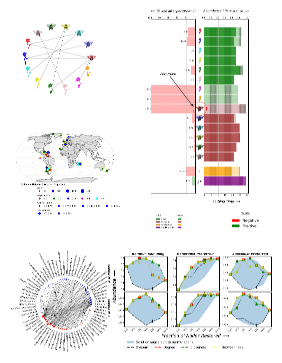

In [403]:
####### Figure
fig = plt.figure(figsize = (8.3/3, 11.7/3), dpi = 100)
plt.tight_layout(pad=0)
ax = plt.axes()  # standard axes
ax.axis('off')

ax1 = plt.axes([0.0, 0.65, 0.35, 0.25])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Model.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax1.imshow(im)
ax1.axis('off')

ax2 = plt.axes([0.4, 0.40, 0.6-0.05, 0.5])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Results_Updated_Divergence.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax2.imshow(im)
ax2.axis('off')

ax2_l1 = plt.axes([0.4, 0.30, 0.4-0.05, 0.1])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Results_Divergence_Legend_1.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax2_l1.imshow(im)
ax2_l1.axis('off')

ax2_l2 = plt.axes([0.8-0.05, 0.30, 0.2, 0.1])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Results_Divergence_Legend_2.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax2_l2.imshow(im)
ax2_l2.axis('off')

ax3 = plt.axes([0.0, 0.30, 0.4, 0.35])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "World_Map.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax3.imshow(im)
ax3.axis('off')

ax4 = plt.axes([0.0, 0.0, 0.4, 0.30])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Figure 01_Sample Network_Updated.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax4.imshow(im)
ax4.axis('off')

ax5 = plt.axes([0.35, 0.0, 0.65-0.05, 0.30])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Sample_Network_Feasibility.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax5.imshow(im)
ax5.axis('off')

# fig.text(0.15, 0.875, r"(a)", va='center', ha='center', fontsize=22, style='italic')
# fig.text(0.425, 0.875, r"(b)", va='center', ha='center', fontsize=22, style='italic')
# fig.text(0.15, 0.65, r"(c)", va='center', ha='center', fontsize=22, style='italic')
# fig.text(0.60, 0.625, r"(d)", va='center', ha='center', fontsize=22, style='italic')
# fig.text(0.15, 0.35, r"(e)", va='center', ha='center', fontsize=22, style='italic')

# ax3.annotate('', xy=(0.3, 0.55), xycoords='axes fraction', xytext=(0.6, 0.55), 
#             arrowprops=dict(arrowstyle="<-", color='b', linewidth=5))

# fig.text(0.50, -0.025, r"Fraction of Nodes Restored $\longrightarrow$", va='center', ha='center', fontsize=60, style='italic')
# fig.text(-0.015, 0.6, r"Abundance $\longrightarrow$", va='center', ha='center', rotation='vertical', fontsize=60, style='italic')

Text(0.15, 0.35, '(e)')

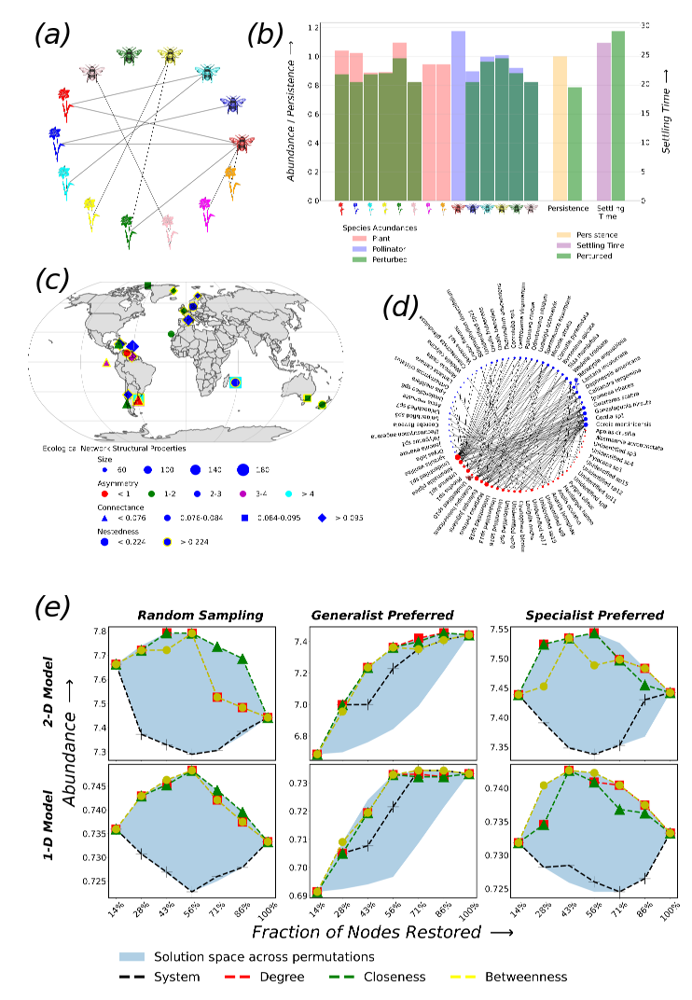

In [4]:
####### Figure
fig = plt.figure(figsize = (8.3, 11.7), dpi = 100)

ax = plt.axes()  # standard axes
ax.axis('off')

ax1 = plt.axes([0.1, 0.65, 0.35, 0.25])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Model.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax1.imshow(im)
ax1.axis('off')

ax2 = plt.axes([0.45, 0.65, 0.5, 0.25])
#im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Results.png"))
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Toy_Results_Updated.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax2.imshow(im)
ax2.axis('off')

ax3 = plt.axes([0.0, 0.40, 0.65, 0.25])
# ax3 = plt.axes([0.55, 0.40, 0.40, 0.25])
# ax3 = plt.axes([0.0, 0.40, 0.40, 0.25])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "World_Map.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
# im = im[:, :, [2, 1, 0]]
ax3.imshow(im)
ax3.axis('off')

ax4 = plt.axes([0.55, 0.40, 0.40, 0.25])
# ax4 = plt.axes([0.0, 0.40, 0.65, 0.25])
#im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Sample_Network.png"))
#im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Sample_Network_NoFrame.png"))
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Figure 01_Sample Network_Updated.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax4.imshow(im)
ax4.axis('off')

ax5 = plt.axes([0.10, 0.0, 0.9, 0.35])
im = cv2.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "Sample_Network_Feasibility.png"))
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
ax5.imshow(im)
ax5.axis('off')

fig.text(0.15, 0.875, r"(a)", va='center', ha='center', fontsize=22, style='italic')
fig.text(0.425, 0.875, r"(b)", va='center', ha='center', fontsize=22, style='italic')
fig.text(0.15, 0.65, r"(c)", va='center', ha='center', fontsize=22, style='italic')
fig.text(0.60, 0.625, r"(d)", va='center', ha='center', fontsize=22, style='italic')
fig.text(0.15, 0.35, r"(e)", va='center', ha='center', fontsize=22, style='italic')

# ax3.annotate('', xy=(0.3, 0.55), xycoords='axes fraction', xytext=(0.6, 0.55), 
#             arrowprops=dict(arrowstyle="<-", color='b', linewidth=5))

# fig.text(0.50, -0.025, r"Fraction of Nodes Restored $\longrightarrow$", va='center', ha='center', fontsize=60, style='italic')
# fig.text(-0.015, 0.6, r"Abundance $\longrightarrow$", va='center', ha='center', rotation='vertical', fontsize=60, style='italic')

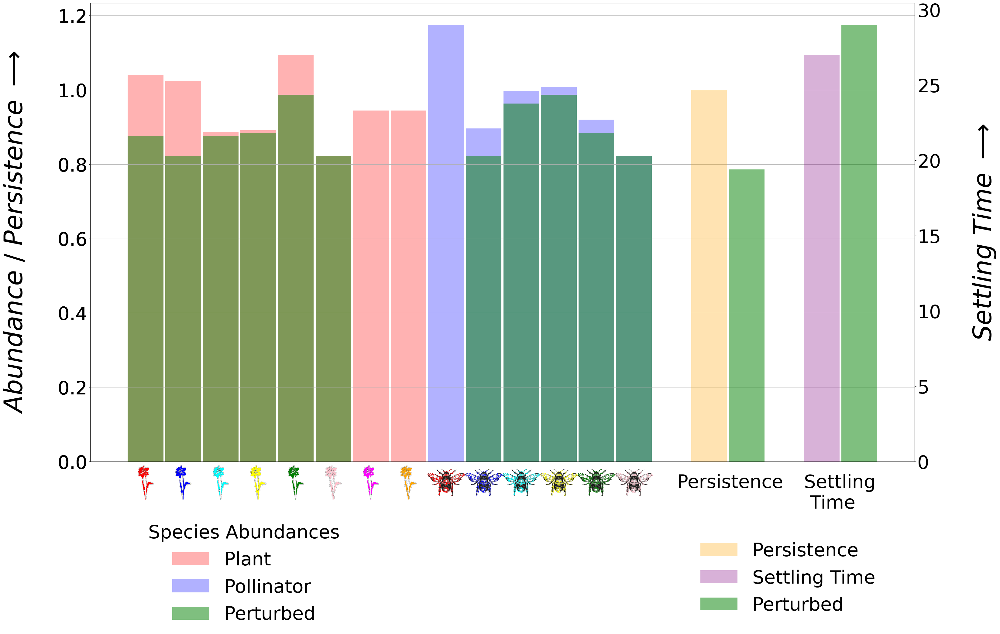

In [2]:
####### Toy
def Solve_Toy(S = 14, A = 0.75, C = 0.25, N = -1):
    X = init_SyntheticData(A = A, C = C, S = S)
    
    M_df = X[0][N]
    NetM = getNetDefinitions(M_df)
    
    Data = []
    R = []
    P = []
    n,m = [0,0]
    
    xL, xP, xA = ODE_Solve_Low(M_df,t0=0,tf=100,num=50,x_low=10e-6)
    XL = xL[-1,:]
    XP = xP[-1,:]
    XA = xA[-1,:]
    Data += [list(XL)]
    
    R += [getResilience(xL)]
    
    n = len(XP)
    m = len(XA)
    
    Nodes = list(NetM.nodes)
    Nodes.sort()
    Nodes_degree = dict(NetM.degree)
    Node_Choice = max(Nodes_degree, key=Nodes_degree.get)
    Node_ind = Nodes.index(max(Nodes_degree, key=Nodes_degree.get))
    if Node_Choice[0] == 'A':
        M_per = M_df.drop(labels = [Node_Choice], axis = 0)
    if Node_Choice[0] == 'B':
        M_per = M_df.drop(labels = [Node_Choice], axis = 1)
    xL, xP, xA = ODE_Solve_Low(M_per,t0=0,tf=100,num=50,x_low=10e-6)
    XL = xL[-1,:]
    XP = xP[-1,:]
    XA = xA[-1,:]
    Data += [list(XL)]
    R += [getResilience(xL)]
    Data[1] = Data[1][:Node_ind] + [0] + Data[1][Node_ind:]
    
    Per_degree = dict(getNetDefinitions(M_per).degree)
    DF = pd.DataFrame(Nodes, columns = ['Nodes'])
    DF['Ori'] = Data[0]
    DF['Per'] = [Data[1][x] if (Per_degree.get(y) != 0) else 0 for x,y in enumerate(Nodes)]
    Data[0] = list(DF['Ori'])
    Data[1] = list(DF['Per'])
    
    P += [sum([1 if x>0 else 0 for x in Data[0]])/(n+m)]
    P += [sum([1 if x>0 else 0 for x in Data[1]])/(n+m)]
    
    return Data, n, m, R, P, M_df

##########################################################################
Data, n, m, R, P, M_df = Solve_Toy(S = 14, A = 0.75, C = 0.25, N = -1)
fig = plt.figure(figsize = (35,20), dpi = 100)

ax = fig.add_subplot(111, label = "1")
ax2 = fig.add_subplot(111, label = "2", frame_on = False, sharey = ax)
ax3 = fig.add_subplot(111, label = "3", frame_on = False, sharex = ax)
ax4 = fig.add_subplot(111, label = "3", frame_on = False, sharex = ax, sharey = ax)
ax3.yaxis.set_label_position("right")
ax3.yaxis.tick_right()

ax.grid()

aa = ax.bar(np.arange(n) + 0.0, Data[0][:n], color = 'r', width = 0.95, alpha = 0.3, label = r"$Plant$")
bb = ax.bar(np.arange(m) + n, Data[0][n:], color = 'b', width = 0.95, alpha = 0.3, label = r"$Pollinator$")
cc = ax.bar(np.arange(len(Data[0])) + 0.0, Data[1], color = 'g', width = 0.95, alpha = 0.5, label = r"$Perturbed$")

p = ax4.bar( [0,n+m + 1], [0,P[0]], color = 'orange', width = 0.95, alpha = 0.3, label = r"$ST_{Original}$")
p2 = ax4.bar( [0,n+m + 2], [0,P[1]], color = 'g', width = 0.95, alpha = 0.5, label = r"$ST_{Original}$")

res = ax3.bar( [0,n+m + 3 + 1], [0,R[0]], color = 'purple', width = 0.95, alpha = 0.3, label = r"$P_{Original}$")
res2 = ax3.bar( [0,n+m + 4 + 1], [0,R[1]], color = 'g', width = 0.95, alpha = 0.5, label = r"$P_{Original}$")

# dd = ax2.axhline(y = np.mean(Data[0][:n]), color = 'r', linestyle = 'dashed', linewidth = 10, label = r"$Plant$")
# ee = ax2.axhline(y = np.mean(Data[0][n:]), color = 'b', linestyle = 'dashed', linewidth = 10, label = r"$Pollinator$")
# ff = ax2.axhline(y = np.mean([x for x in Data[1] if x != 0]), color = 'g', linestyle = 'dashed', linewidth = 10, label = r"$Perturbed$")
# ff = ax2.axhline(y = np.mean(Data[1]), color = 'g', linestyle = 'dashed', linewidth = 10, label = r"$Perturbed$")

ax.set_xticks([])
ax2.set_xticks([])
#ax2.set_yticks([])

ax.tick_params(axis='both', which='major', labelsize=44)
ax.tick_params(axis='both', which='minor', labelsize=44)
ax2.tick_params(axis='both', which='major', labelsize=44)
ax2.tick_params(axis='both', which='minor', labelsize=44)

ax3.tick_params(axis='both', which='major', labelsize=44)
ax3.tick_params(axis='both', which='minor', labelsize=44)

ax4.tick_params(axis='both', which='major', labelsize=44)
ax4.tick_params(axis='both', which='minor', labelsize=44)

# ax.set_yticklabels([0.0,0.2,0.4,0.6,0.8,1.0], fontsize = 44)
#ax.set_yticklabels([round(x,1) for x in np.arange(0.0,1.25,0.2)], fontsize = 44)

plt.ylabel(r"$Abundance$ / $Persistence$ $\longrightarrow$" + '\n', fontsize = 60)

ax3.set_ylabel('\n' + r"$Settling$ $Time$ $\longrightarrow$", fontsize = 60)

# plt.legend(bbox_to_anchor = [0,0])
# plt.legend(bbox_to_anchor = [1,0])

# l1 = ax.legend(
#     [aa, bb, cc],
#     [r"$Plant$", r"$Pollinator$", r"$Perturbed$"],
#     title = 'Species Abundance',
#     bbox_to_anchor = [1.05,1.0], loc = 'upper left', fontsize = 44, ncol = 1)
# l2 = ax2.legend(
#     [dd, ee, ff],
#     [r"$Plant$", r"$Pollinator$", r"$Perturbed$"],
#     title = 'Mean Abundance',
#     bbox_to_anchor = [1.05,0.7], loc = 'upper left', fontsize = 44, ncol = 1)
# ax.add_artist(l1)
# T1 = l1.get_title()
# T1.set_fontsize(44)
# T2 = l2.get_title()
# T2.set_fontsize(44)

# legend_elements = [Line2D([0], [0], color='b', lw=4, label='Line'),
#                    Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='g', markersize=15),
#                    Patch(facecolor='orange', edgecolor='r', label='Color Patch')]
legend_elements = [
    Patch(facecolor='red', label='Plant', alpha = 0.3),
    Patch(facecolor='blue', label='Pollinator', alpha = 0.3),
    Patch(facecolor='green', label='Perturbed', alpha = 0.5)
    ]
l1 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.0 + 0.05,-0.1], loc = 'upper left', title = 'Species Abundances', fontsize = 44, frameon = False, ncol = 1)
l1.get_title().set_fontsize(44)
'''
legend_elements = [
    Line2D([0], [0], color='r', lw=10, linestyle = 'dashed' , label='Plant'),
    Line2D([0], [0], color='b', lw=10, linestyle = 'dashed' , label='Pollinator'),
    Line2D([0], [0], color='g', lw=10, linestyle = 'dashed' , label='Perturbed')
    ]
l2 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.3 + 0.05,-0.1], loc = 'upper left', title = 'Mean Abundance', fontsize = 44, frameon = False, ncol = 1)
l2.get_title().set_fontsize(44)
ax.add_artist(l1)
'''
legend_elements = [
    Patch(facecolor='orange', label='Persistence', alpha = 0.3),
    Patch(facecolor='purple', label='Settling Time', alpha = 0.3),
    Patch(facecolor='green', label='Perturbed', alpha = 0.5)
    ]
l3 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.55 + 0.17,-0.08], loc = 'upper left', title = ' ', fontsize = 44, frameon = False, ncol = 1)
l3.get_title().set_fontsize(44)
#ax.add_artist(l2)
ax.add_artist(l1)

def offset_image(i, coord, ax, c, z = 0.2):
    img = plt.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "{}_{}.png".format(c,i+1)))
    im = OffsetImage(img, zoom=z)
    im.image.axes = ax

    ab = AnnotationBbox(im, (coord, 0),  xybox=(0., -50.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)

    ax.add_artist(ab)

for i in range(n):
    offset_image(i, i, ax, 'Plant', 0.3)

for i in range(n,n+m):
    offset_image(i-n, i, ax, 'Bee')

# img = plt.imread(r"C:\Users\sarth\Desktop\Ecology Paper\Species_Pics\Plant.png")
# im = OffsetImage(img, zoom=0.7)
# im.image.axes = ax
# ab = AnnotationBbox(im, (3, 0),  xybox=(0., -100.), frameon=False,
#                         xycoords='data',  boxcoords="offset points", pad=0)
# ax.add_artist(ab)

ab = AnnotationBbox(TextArea('Persistence', textprops = dict(size = 44)), (15, 0),  xybox=(50., -50.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)
ax.add_artist(ab)

ab = AnnotationBbox(TextArea('Settling \n Time', textprops = dict(size = 44)), (18, 0),  xybox=(50., -75.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)
ax.add_artist(ab)

del Data, n, m, R, P, M_df
del aa, bb, cc
#del dd, ee, ff
del fig, ax, ax2, ax3, ax4, p, p2, res, res2
# del l1, l2, T1, T2
# del legend_elements, l

In [4]:
Data, n, m, R, P, M_df = Solve_Toy(S = 14, A = 0.75, C = 0.25, N = -1)

In [405]:
fig = plt.figure(figsize = (35,20), dpi = 600)

ax = fig.add_subplot(211, label = "1")
ax2 = fig.add_subplot(211, label = "2", frame_on = False, sharey = ax)
ax3 = fig.add_subplot(211, label = "3", frame_on = False, sharex = ax)
ax4 = fig.add_subplot(211, label = "3", frame_on = False, sharex = ax, sharey = ax)
ax3.yaxis.set_label_position("right")
ax3.yaxis.tick_right()

ax_1 = fig.add_subplot(212, label = "4", sharex = ax)
# ax_1 = plt.axes([0.0, 0.40, 0.65, 0.25])

# ax_1.spines['top'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
for side in ['top', 'bottom', 'left', 'right']:
    ax.spines[side].set_linewidth(3.5)
    ax_1.spines[side].set_linewidth(3.5)

ax.grid()
ax_1.grid()

aa = ax.bar(np.arange(n) + 0.0, Data[0][:n], color = 'green', width = 0.95, alpha = 0.3, label = r"$Plant$", hatch='o')
bb = ax.bar(np.arange(m) + n, Data[0][n:], color = 'brown', width = 0.95, alpha = 0.3, label = r"$Pollinator$", hatch='o')
cc = ax.bar(np.arange(8), Data[1][:8], color = 'green', width = 0.95, alpha = 0.7, label = r"$Perturbed$")
cc = ax.bar(np.arange(8,14), Data[1][8:], color = 'brown', width = 0.95, alpha = 0.7, label = r"$Perturbed$")
cc_div = ax_1.bar(np.arange(len(Data[0])) + 0.0, [(100*(Data[0][i]-x))/Data[0][i] for i,x in enumerate(Data[1])], color = 'red', width = 0.95, alpha = 0.3, label = r"$Perturbed$")

p = ax4.bar( [0,n+m + 1- 0.5], [0,P[0]], color = 'orange', width = 0.95, alpha = 0.3, label = r"$P_{Original}$", hatch='o')
p = ax4.bar( [0,n+m + 1- 0.5], [0,P[1]], color = 'orange', width = 0.95, alpha = 0.7, label = r"$P_{Original}$")
p2 = ax_1.bar( [0,n+m + 1 - 0.5], [0,(100*abs(P[0]-P[1]))/P[0]], color = 'red', width = 0.95, alpha = 0.3, label = r"$P_{Original}$")

res = ax3.bar( [0,n+m + 2 - 0.5], [0,R[0]], color = 'purple', width = 0.95, alpha = 0.3, label = r"$ST_{Original}$", hatch='o')
res = ax3.bar( [0,n+m + 2 - 0.5], [0,R[1]], color = 'purple', width = 0.95, alpha = 0.7, label = r"$ST_{Original}$")
res2 = ax_1.bar( [0,n+m + 2 - 0.5], [0,(100*abs(R[0]-R[1]))/R[0]], color = 'green', width = 0.95, alpha = 0.3, label = r"$ST_{Original}$")

ax.set_xticks([])
ax2.set_xticks([])
#ax2.set_yticks([])

ax_1.set_ylim([100, 0.0])

ax.tick_params(axis='both', which='major', labelsize=24, rotation = 90)
ax.tick_params(axis='both', which='minor', labelsize=24, rotation = 90)
ax2.tick_params(axis='both', which='major', labelsize=24, rotation = 90)
ax2.tick_params(axis='both', which='minor', labelsize=24, rotation = 90)

ax3.tick_params(axis='both', which='major', labelsize=24, rotation = 90)
ax3.tick_params(axis='both', which='minor', labelsize=25, rotation = 90)

ax4.tick_params(axis='both', which='major', labelsize=24, rotation = 90)
ax4.tick_params(axis='both', which='minor', labelsize=24, rotation = 90)

ax_1.tick_params(axis='both', which='major', labelsize=24, rotation = 90)

ax.set_ylabel(r"$Abundance$ / $Persistence$ $\longrightarrow$" + '\n', fontsize = 36)
ax3.set_ylabel('\n' + r"$Settling$ $Time$ $\longrightarrow$", fontsize = 36)
ax_1.set_ylabel(r"$\longleftarrow$ % $loss \, after \, perturbation$" + '\n', fontsize = 36)

def offset_image(i, coord, ax, c, z = 0.2):
    img = plt.imread(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', 'Images', "{}_{}.png".format(c,i+1)))
    img = img.transpose(1,0,2)
    im = OffsetImage(img, zoom=z)
    im.image.axes = ax
    # print(img.shape)
    ab = AnnotationBbox(im, (coord, 0),  xybox=(0., -50.), frameon=False,
                        xycoords='data',  boxcoords="offset points", pad=0)

    ax.add_artist(ab)

for i in range(n):
    offset_image(i, i, ax, 'Plant', 0.3)

for i in range(n,n+m):
    offset_image(i-n, i, ax, 'Bee')

import matplotlib.patches as patches

# rect_frame = patches.Rectangle((-2.0, 0.0), 1.0, 0.2, linewidth=1, edgecolor='r', facecolor='none')
# fig.add_patch(rect_frame)

# ax.axvline(14-0.25, c = 'k', linewidth = 3, linestyle = 'dashed')
# ax_1.axvline(14-0.25, c = 'k', linewidth = 3, linestyle = 'dashed')

fig.text(0.805, 0.5, r"$P$", va='center', ha='center', fontsize=36, style='italic', rotation = 90)
fig.text(0.85, 0.5, r"$ST$", va='center', ha='center', fontsize=36, style='italic', rotation = 90)

for i in np.arange(len(Data[0])):
    ax_1.text(i,(100*(Data[0][i]-Data[1][i]))/Data[0][i] + 7, rf"-{round((100*(Data[0][i]-Data[1][i]))/Data[0][i],2)} ", va='center', ha='center', fontsize=22, style='italic', rotation = 135-45)

ax_1.text(m+n+1-0.5,(100*abs(P[0]-P[1]))/P[0] + 7, rf"-{round((100*abs(P[0]-P[1]))/P[0],2)} ", va='center', ha='center', fontsize=22, style='italic', rotation = 135-45)
ax_1.text(m+n+2-0.5,(100*abs(R[0]-R[1]))/R[0] + 7, rf"+{round((100*abs(R[0]-R[1]))/R[0],2)} ", va='center', ha='center', fontsize=22, style='italic', rotation = 135-45)

ax_circle = fig.add_subplot(1, 1, 1, aspect=1, frame_on = False)

patch_circle = patches.Circle((0.523, 0.5), 0.07, edgecolor='r', facecolor='none', clip_on = False, linewidth = 3)
ax_circle.add_patch(patch_circle)

ax_circle.annotate(r"$Perturbed$", xy=(0.5, 0.43), xytext=(0.15, 0.10), fontsize = 36, rotation = 90,
            arrowprops=dict(arrowstyle="->", linewidth = 5, mutation_scale=55))
ax_circle.set_xticks([])
ax_circle.set_yticks([])

for a in [ax,ax2,ax3,ax4,ax_1]:
    a.patch.set_visible(False)
plt.savefig('plot_toy.png', transparent = True)

plt.show()

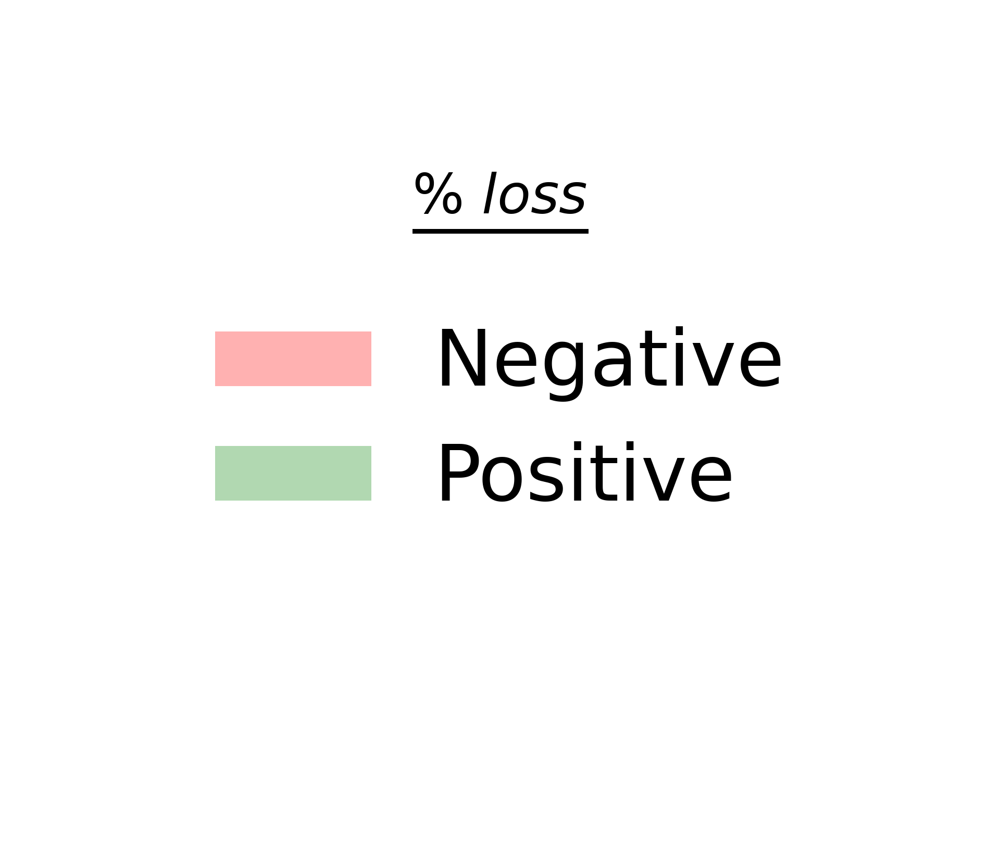

In [406]:
fig = plt.figure(figsize = (3,2.5), dpi = 600)
ax = fig.add_subplot(111, label = "1")
ax.axis('off')

legend_elements = [
    Patch(facecolor='red', label='Negative', alpha = 0.3),
    Patch(facecolor='green', label='Positive', alpha = 0.3)
    ]
l1 = ax.legend(
    handles=legend_elements, 
    bbox_to_anchor = [0.5,0.5], 
    loc = 'center', 
    title = '', 
    fontsize = 18, 
    frameon = False, 
    ncol = 1
    )
# l1.get_title().set_fontsize(18)

fig.text(0.5, 0.75, r"$\frac{\% \,\, loss}{\,}$", va='center', ha='center', fontsize=18, style='italic')
fig.tight_layout(pad=0)
plt.show()

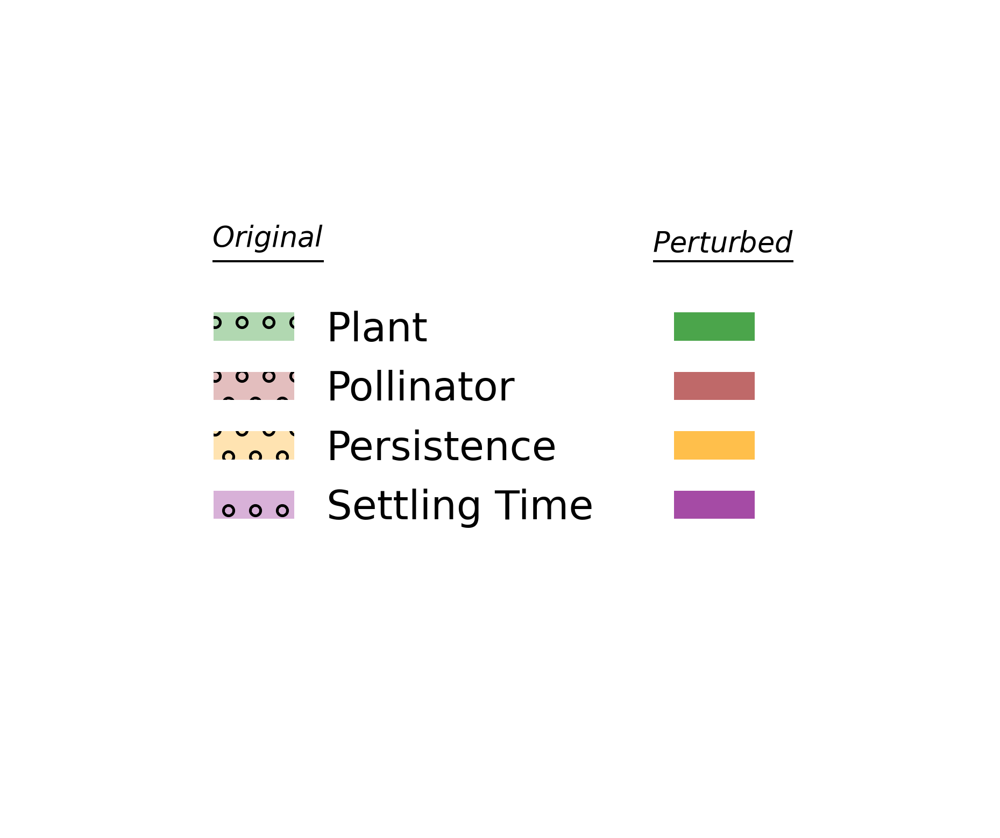

In [349]:
fig = plt.figure(figsize = (6,5), dpi = 300)
ax = fig.add_subplot(111, label = "1")
ax.axis('off')

legend_elements = [
    Patch(facecolor='green', label='Plant', alpha = 0.3, hatch = 'o'),
    Patch(facecolor='brown', label='Pollinator', alpha = 0.3, hatch = 'o'),
    Patch(facecolor='orange', label='Persistence', alpha = 0.3, hatch = 'o'),
    Patch(facecolor='purple', label='Settling Time', alpha = 0.3, hatch = 'o'),
    Patch(facecolor='green', label='', alpha = 0.7),
    Patch(facecolor='brown', label='', alpha = 0.7),
    Patch(facecolor='orange', label='', alpha = 0.7),
    Patch(facecolor='purple', label='', alpha = 0.7)
    ]
l1 = ax.legend(
    handles=legend_elements, 
    bbox_to_anchor = [0.5,0.5], 
    loc = 'center', 
    title = '', 
    fontsize = 18, 
    frameon = False, 
    ncol = 2
    )
# l1.get_title().set_fontsize(36)

fig.text(0.26, 0.7, r"$\frac{Original}{\,}$", va='center', ha='center', fontsize=18, style='italic')
fig.text(0.73, 0.7, r"$\frac{Perturbed}{\,}$", va='center', ha='center', fontsize=18, style='italic')
fig.tight_layout(pad=0)
plt.show()


In [409]:
####### World Map
Data = []
Data += [['M_PL_002',-33.223334 , -70.226668]]
Data += [['M_PL_003',-33.223334 , -70.266668]]
Data += [['M_PL_009',68.35 , 18.5]]
Data += [['M_PL_010',74.5 , -20.5]]
Data += [['M_PL_012',28.127842 , -17.248908]]
Data += [['M_PL_014',81.816667 , -71.3]]
Data += [['M_PL_017',51.574994 , -2.589902]]
Data += [['M_PL_018',56.238737 , 9.973652]]
Data += [['M_PL_019',-36.45 , 148.266667]]
Data += [['M_PL_022',-34.166667 , -69.7]]
Data += [['M_PL_023',-33 , -69.283333]]
Data += [['M_PL_026',-0.5 , -90.5]]
Data += [['M_PL_028',-43.02823 , 171.78466]]
Data += [['M_PL_029',-43.099531 , 171.720224]]
Data += [['M_PL_030',8.933333 , -67.416667]]
Data += [['M_PL_031',5.583333 , -61.716667]]
Data += [['M_PL_034',-42 , -73.583333]]
Data += [['M_PL_035',17.916667 , -76.191667]]
Data += [['M_PL_040',18.353889 , -77.645278]]
Data += [['M_PL_041',15.518889 , -61.467222]]
Data += [['M_PL_043',56.238737 , 9.953652]]
Data += [['M_PL_058',42.2973 , 3.235217]]
Data += [['M_PL_060_04',-20.73 , 57.73]]
Data += [['M_PL_060_05',-20.73 , 57.73]]
Data += [['M_PL_060_06',-20.73 , 57.73]]
Data += [['M_PL_060_07',-20.73 , 57.73]]
Data += [['M_PL_072_01',-37.842015 , -58.35858]]
Data += [['M_PL_072_02',-37.842015 , -58.35858]]
Data += [['M_PL_072_03',-37.842015 , -58.35858]]
Data += [['M_PL_072_04',-37.842015 , -58.35858]]

D = np.array(Data)
D = pd.DataFrame(D, columns = ['Name', 'Lat', 'Long'])
del Data
Network_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"Network_Solved_Real.pkl"))
D['S'] = Network_df.Size
D['A'] = Network_df.Assymetry
D['C'] = Network_df.Connectance
D['N'] = Network_df.Nestedness
del Network_df
#
# Size = Size of Marker
# Asymmetry = Color of Marker {0-1,1-2,2-3,3-4,4-5} : {red, orange, blue, green, pink}
# Connectance = Marker Style {0-25%, 25-50, 50-75, 75-100} : {^, o, s, D}
# Nestedness = Marker Border {}

# ax = plt.axes(projection=ccrs.Mollweide())
# ax = plt.axes(projection=ccrs.PlateCarree())
# ax = plt.axes(projection=ccrs.Robinson())
# ax = plt.axes(projection=ccrs.AlbersEqualArea())

#
Node_Type = {}
Node_Type_DF = pd.DataFrame()
for ind in range(D.shape[0]):
    Node_Type[ind] = {}
    i = D.shape[0] - ind -1
    
    Name = D.iloc[i,0]
    Lat = D.iloc[i,1]
    Long = D.iloc[i,2]
    
    Node_Type[ind]['Name'] = Name
    Node_Type[ind]['Long'] = Long
    Node_Type[ind]['Lat'] = Lat
    
    # if np.float(D.iloc[i,4]) < 1.0:
    #     c = 'red'
    # elif np.float(D.iloc[i,4]) < 2.0:
    #     c = 'cyan'
    # elif np.float(D.iloc[i,4]) < 3.0:
    #     c = 'blue'
    # elif np.float(D.iloc[i,4]) < 4.0:
    #     c = 'green'
    # elif np.float(D.iloc[i,4]) < 5.0:
    #     c = 'purple'
    
    if np.float(D.iloc[i,4]) < 1.0:
        c = 'r'
    elif np.float(D.iloc[i,4]) < 2.0:
        c = 'g'
    elif np.float(D.iloc[i,4]) < 3.0:
        c = 'b'
    elif np.float(D.iloc[i,4]) < 4.0:
        c = 'm'
    elif np.float(D.iloc[i,4]) < 5.0:
        c = 'cyan'
    
    Node_Type[ind]['c'] = c
    
    if np.float(D.iloc[i,5]) < np.quantile(D.iloc[:,5], 0.25):
        marker = '^'
    elif np.float(D.iloc[i,5]) < np.quantile(D.iloc[:,5], 0.50):
        marker = 'o'
    elif np.float(D.iloc[i,5]) < np.quantile(D.iloc[:,5], 0.75):
        marker = 's'
    else:
        marker = 'D'
    
    Node_Type[ind]['marker'] = marker
    
    if np.float(D.iloc[i,6]) < np.quantile(D.iloc[:,6], 0.50):
        edgecolor = c
        linewidth = 5
    else:
        edgecolor = 'yellow'
        linewidth = 7
    
    Node_Type[ind]['edgecolor'] = edgecolor
    Node_Type[ind]['linewidth'] = linewidth
    Node_Type[ind]['size'] = D.iloc[i,3]

Node_Type_DF['ind'] = np.arange(D.shape[0])
for col in ['Name', 'Long', 'Lat', 'c', 'marker', 'edgecolor', 'linewidth', 'size']:
    Node_Type_DF[col] = [Node_Type[i][col] for i in Node_Type.keys()]

del Name, Lat, Long, c, edgecolor, i, ind, linewidth, marker

##########################################################################
fig = plt.figure(figsize=(35,50), dpi = 300)

ax = fig.add_subplot(1,1,1, projection=ccrs.Robinson())

ax.set_global()

ax.add_feature(cfeature.COASTLINE, edgecolor="k", linewidth = 5, alpha = 0.5)
ax.add_feature(cfeature.BORDERS, edgecolor="k", linewidth = 5, alpha = 0.5)
ax.add_feature(cfeature.LAND, facecolor="gray", alpha = 0.25)
ax.gridlines(linewidth = 3, alpha = 0.5)

def plot_world_map(i, alpha = 1.0):
    plt.scatter(
        np.float(Node_Type[i]['Long']),
        np.float(Node_Type[i]['Lat']), 
        c = Node_Type[i]['c'],
        marker = Node_Type[i]['marker'],
        edgecolor = Node_Type[i]['edgecolor'],
        linewidth = Node_Type[i]['linewidth'],
        alpha = alpha,
        s = 25*(35 + 200*((Node_Type[i]['size'] - 61) / (180 - 61))),
        transform=ccrs.PlateCarree(), 
        label = Node_Type[i]['Name']
        )

for j,k in zip([20,10,0],[30,20,10]):
    for i in list(Node_Type.keys())[j:k]:
        if Node_Type[i]['marker'] == 'D':
            plot_world_map(i, alpha = 1.0)
    for i in list(Node_Type.keys())[j:k]:
        if Node_Type[i]['marker'] == 's':
            plot_world_map(i, alpha = 1.0)
    for i in list(Node_Type.keys())[j:k]:
        if Node_Type[i]['marker'] == '^':
            plot_world_map(i, alpha = 1.0)
    for i in list(Node_Type.keys())[j:k]:
        if Node_Type[i]['marker'] == 'o':
            plot_world_map(i, alpha = 1.0)

#Line2D([0], [0], marker='o', color='w', label='Scatter', markerfacecolor='g', markersize=15)
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='60', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((61 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label='100', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((100 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label='140', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((140 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label='180', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((180 - 61) / (180 - 61)))) )
    ]
l1 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.20,-0.05], loc = 'upper left', title = 'Size', fontsize = 44, frameon = False, ncol = 4)
l1.get_title().set_fontsize(44)
l1._legend_box.align = "left"
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=r'< 1', markerfacecolor='r', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label=r'1-2', markerfacecolor='g', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label=r'2-3', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label=r'3-4', markerfacecolor='m', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label=r'> 4', markerfacecolor='cyan', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) )
    ]
l2 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.20,-0.20], loc = 'upper left', title = 'Asymmetry', fontsize = 44, frameon = False, ncol = 5)
l2.get_title().set_fontsize(44)
l2._legend_box.align = "left"
ax.add_artist(l1)

legend_elements = [
    Line2D([0], [0], marker='^', color='w', label=r'< 0.076', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label=r'0.076-0.084', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='s', color='w', label=r'0.084-0.095', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='D', color='w', label=r'> 0.095', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((80 - 61) / (180 - 61)))) )
    ]
l3 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.20,-0.35], loc = 'upper left', title = 'Connectance', fontsize = 44, frameon = False, ncol = 4)
l3.get_title().set_fontsize(44)
l3._legend_box.align = "left"
ax.add_artist(l2)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=r'< 0.224', markerfacecolor='b', markersize=np.sqrt(25*(35 + 200*((100 - 61) / (180 - 61)))) ),
    Line2D([0], [0], marker='o', color='w', label=r'> 0.224', markerfacecolor='b', markeredgecolor = 'yellow', markeredgewidth=7, markersize=np.sqrt(25*(35 + 200*((100 - 61) / (180 - 61)))) )
    ]
l4 = ax.legend(handles=legend_elements, bbox_to_anchor = [0.20,-0.50], loc = 'upper left', title = 'Nestedness', fontsize = 44, frameon = False, ncol = 4)
l4.get_title().set_fontsize(44)
l4._legend_box.align = "left"
ax.add_artist(l3)

ab = AnnotationBbox(TextArea('Ecological Network Structural Properties', textprops = dict(size = 44)), (0, 0),  xybox=(650.0, 650.0), frameon=False,
                        xycoords='figure points',  boxcoords="offset points", pad=0)
ax.add_artist(ab)



# ax.annotate('', xy=(0.3, 0.55), xycoords='figure points', xytext=(0.6, 0.55), 
#             arrowprops=dict(arrowstyle="<-", color='k', linewidth=5))
ax.patch.set_visible(False)
plt.show()

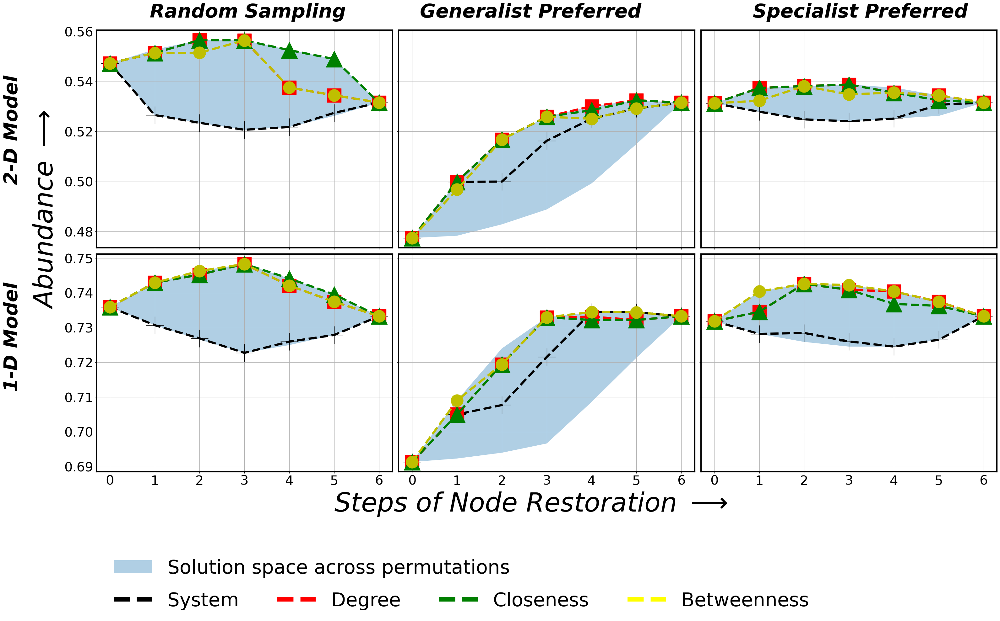

In [421]:
####### Feasibility
'''
def get_FeasibilityPlots(S = 0):
    Data = {}
    M_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_Real.pkl"))['M_PL_041']
    for ID in range(720):

        FileName = "M_PL_041/Files{x0}/M_PL_041-Data_{x1}.pkl".format(x0 = S, x1 = ID)
        X = UnpickleObj(FileName)
        x_abundance = X[3]
        x_avg_abundance = np.zeros(len(x_abundance))
        X_Persistence = np.zeros(len(x_abundance))
        for step in range(len(x_abundance)):
            x_avg_abundance[step] = np.mean(np.array(x_abundance[step][-1,:]))
            #x_avg_abundance[step] = np.mean(np.array(list(map(isExtinct,x_abundance[step][-1,:]))))
            X_Persistence[step] = getPersistence(np.array(list(map(isExtinct,x_abundance[step][-1,:])))) / M_df.shape[0]
        X_Abundance = x_avg_abundance
        X_Resilience = np.array(list(map(getResilience, x_abundance)))
        
        Data[ID] = [X_Abundance, [str(x) for x in X[0]], X_Resilience, X_Persistence]
        
    del M_df, ID, FileName, X, x_abundance, x_avg_abundance, X_Persistence, step, X_Abundance, X_Resilience
    #
    Data2 = {}
    M_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_Real.pkl"))['M_PL_041']
    for ID in range(720):
        FileName = "M_PL_041/Files{x0}_2D/M_PL_041-Data_{x1}.pkl".format(x0 = S, x1 = ID)
        X = UnpickleObj(FileName)
        x_abundance = X[3]
        x_avg_abundance = np.zeros(len(x_abundance))
        X_Persistence = np.zeros(len(x_abundance))
        for step in range(len(x_abundance)):
            x_avg_abundance[step] = np.mean(np.array(x_abundance[step][-1,:]))
            #x_avg_abundance[step] = np.mean(np.array(list(map(isExtinct,x_abundance[step][-1,:]))))
            X_Persistence[step] = getPersistence(np.array(list(map(isExtinct,x_abundance[step][-1,:])))) / (M_df.shape[0]+M_df.shape[1])
        X_Abundance = x_avg_abundance
        X_Resilience = np.array(list(map(getResilience, x_abundance)))
        
        Data2[ID] = [X_Abundance, [str(x) for x in X[0]], X_Resilience, X_Persistence]
        
    del M_df, ID, FileName, X, x_abundance, x_avg_abundance, X_Persistence, step, X_Abundance, X_Resilience
    #
    Seq = {}
    for Centrality in ['degree','closeness','betweenness']:
        Seq[Centrality] = []
    for Centrality in ['degree','closeness','betweenness']:
        Node_del = [str(x) for x in UnpickleObj("M_PL_041/Files{x0}/M_PL_041-Data_{x1}.pkl".format(x0 = S, x1 = 0))[0]]
        M_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_Real.pkl"))['M_PL_041']
        M_per = RemovalFromNodeList(Node_del,M_df,axis=0)
        Nodes_to_restore = getProspectiveSpecies(M_per, M_df, axis = 0)    
        for p in range(len(Nodes_to_restore)):
            centrality_restoration = {}
            beta_diff = np.zeros((len(Nodes_to_restore),))
            for q in range(len(Nodes_to_restore)):
                M_per_temp = M_per.copy(deep = True)
                    
                M_per_temp = M_per_temp.append(M_df.loc[Nodes_to_restore[q]])
                    
                M_per_temp[M_per_temp.isnull()] = M_df
     
                NetM_per_temp, _, _ = getNetDefinitions(M_per_temp,None,None,[True, False, False])
                
                if Centrality == 'degree':
                    centrality_dict = nx.degree_centrality(NetM_per_temp)
                if Centrality == 'closeness':
                    centrality_dict = nx.closeness_centrality(NetM_per_temp)
                if Centrality == 'betweenness':
                    centrality_dict = nx.betweenness_centrality(NetM_per_temp)
                centrality_restoration[Nodes_to_restore[q]] = centrality_dict[Nodes_to_restore[q]]
            
            Node_choice = max(centrality_restoration, key = centrality_restoration.get)
            Seq[Centrality].append(Node_choice)
            M_per = M_per.append(M_df.loc[Node_choice])
            M_per[M_per.isnull()] = M_df
            
            Nodes_to_restore = getProspectiveSpecies(M_per, M_df, axis = 0)
            #print(Node_choice)
    
    for Centrality in ['System']:
        Seq[Centrality] = []
    for Centrality in ['System']:
        Node_del = [str(x) for x in UnpickleObj("M_PL_041/Files{x0}/M_PL_041-Data_{x1}.pkl".format(x0 = S, x1 = 0))[0]]
        M_df = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '01_Simulation_Execution', f"M_Real.pkl"))['M_PL_041']
        M_per = RemovalFromNodeList(Node_del,M_df,axis=0)
        Nodes_to_restore = getProspectiveSpecies(M_per, M_df, axis = 0)    
        for p in range(len(Nodes_to_restore)):
            beta_diff = np.zeros((len(Nodes_to_restore),))
            for q in range(len(Nodes_to_restore)):
                M_per_temp = M_per.copy(deep = True)
                    
                M_per_temp = M_per_temp.append(M_df.loc[Nodes_to_restore[q]])
                    
                M_per_temp[M_per_temp.isnull()] = M_df
                #NetM_per_temp, _, _ = getNetDefinitions(M_per_temp,None,None,[True, False, False])
    
                if Centrality == 'System':
                    A_per_temp, _ = getProjectedNet(M_per_temp, [True, False])
                    beta_eff, _, _ = ODE_Solve_Low(t0=0,tf=100,num=30,x_low=0,A=np.array(A_per_temp))
                beta_diff[q] = beta_eff
            Node_choice = Nodes_to_restore[np.argmax(beta_diff)]
            Seq[Centrality].append(Node_choice)
            M_per = M_per.append(M_df.loc[Node_choice])
            M_per[M_per.isnull()] = M_df
            
            Nodes_to_restore = getProspectiveSpecies(M_per, M_df, axis = 0)
            #print(Node_choice)
    del Centrality, Node_del, M_df, M_per, Nodes_to_restore, p, q, centrality_restoration, beta_diff
    del M_per_temp, NetM_per_temp, A_per_temp, beta_eff, Node_choice, centrality_dict
    #
    Seq_collec = {}
    for i in range(720):
        Seq_collec[i] = Data[i][1]
    del i
    idx_lst = {}
    for C in ['degree','closeness','betweenness', 'System']:
        for i in range(720):
            if Seq[C] == Seq_collec[i]:
                idx_lst[C] = i
                print(i)
    del C, i
    
    For_Fill_V = {}
    For_Fill2_V = {}
    
    for V in [0,2,3]:
        #
        For_Fill = {}
        For_Fill[0] = []
        For_Fill[1] = []
        #
        X = []
        for i in range(720):
            X += [Data[i][V]]
        X = np.array(X)
        #
        for i in range(7):
            For_Fill[0].append(np.min(X[:,i]))
            For_Fill[1].append(np.max(X[:,i]))
        del i, X
        
        For_Fill2 = {}
        For_Fill2[0] = []
        For_Fill2[1] = []
        #
        X = []
        for i in range(720):
            X += [Data2[i][V]]
        X = np.array(X)
        #
        for i in range(7):
            For_Fill2[0].append(np.min(X[:,i]))
            For_Fill2[1].append(np.max(X[:,i]))
        del i, X
        
        For_Fill_V[V] = For_Fill
        For_Fill2_V[V] = For_Fill2
        
    return [Data, Data2], idx_lst, [For_Fill_V, For_Fill2_V]

S = {}
S[0] = get_FeasibilityPlots(S = 0) 
S[1] = get_FeasibilityPlots(S = 1)
S[2] = get_FeasibilityPlots(S = 2)

# PickleObj(S, "Feasibility.pkl")
# del S
'''

S = UnpickleObj(os.path.join(os.getcwd(), 'Code', '01_Species_Reintroductions', '06_Figures', "Feasibility.pkl"))

import matplotlib as mpl

mpl.rcParams['axes.linewidth'] = 3.0

## S [Strategy] [ Data[0:1D, 1:2D], idx_lst, For_Fill_V[0:1D, 1:2D] ]
## For_Fill_V [0, 2, 3] [0:min, 1:max]

fig, ax = plt.subplots(2,3, sharex = True, figsize = (30,15), dpi = 100, sharey = 'row')

ax[0,0].fill_between(np.arange(7), [x/14 for x in S[0][2][0][0][0]], [x/14 for x in S[0][2][0][0][1]], alpha = 0.35)
ax[0,1].fill_between(np.arange(7), [x/14 for x in S[1][2][0][0][0]], [x/14 for x in S[1][2][0][0][1]], alpha = 0.35)
ax[0,2].fill_between(np.arange(7), [x/14 for x in S[2][2][0][0][0]], [x/14 for x in S[2][2][0][0][1]], alpha = 0.35)

ax[1,0].fill_between(np.arange(7), S[0][2][1][0][0], S[0][2][1][0][1], alpha = 0.35)
ax[1,1].fill_between(np.arange(7), S[1][2][1][0][0], S[1][2][1][0][1], alpha = 0.35)
ax[1,2].fill_between(np.arange(7), S[2][2][1][0][0], S[2][2][1][0][1], alpha = 0.35)

def Feasibility_Pathways(ax, row, col, Data, idx_lst, V):
    if row == 1:
        ax[row, col].plot(Data[idx_lst['System']][V], 'k+', markersize = 40, linestyle = 'dashed', lw = 5)
        ax[row, col].plot(Data[idx_lst['degree']][V], 'rs', markersize = 32, linestyle = 'dashed', lw = 5)
        ax[row, col].plot(Data[idx_lst['closeness']][V], 'g^', markersize = 38, linestyle = 'dashed', lw = 5)
        ax[row, col].plot(Data[idx_lst['betweenness']][V], 'yo', markersize = 28, linestyle = 'dashed', lw = 5)
    elif row == 0:
        ax[row, col].plot(Data[idx_lst['System']][V]/14, 'k+', markersize = 40, linestyle = 'dashed', lw = 5)
        ax[row, col].plot(Data[idx_lst['degree']][V]/14, 'rs', markersize = 32, linestyle = 'dashed', lw = 5)
        ax[row, col].plot(Data[idx_lst['closeness']][V]/14, 'g^', markersize = 38, linestyle = 'dashed', lw = 5)
        ax[row, col].plot(Data[idx_lst['betweenness']][V]/14, 'yo', markersize = 28, linestyle = 'dashed', lw = 5)
    # ax[row, col].plot(Data[idx_lst['System']][V], 'k', markersize = 24, linestyle = 'dashed', label = 'System')
    # ax[row, col].plot(Data[idx_lst['degree']][V], 'r', markersize = 16, linestyle = 'dashed', label = 'Degree')
    # ax[row, col].plot(Data[idx_lst['closeness']][V], 'g', markersize = 22, linestyle = 'dashed', label = 'Closeness')
    # ax[row, col].plot(Data[idx_lst['betweenness']][V], 'y', markersize = 12, linestyle = 'dashed', label = 'Betweenness')

Feasibility_Pathways(ax = ax, row = 0, col = 0, Data = S[0][0][0], idx_lst = S[0][1], V = 0)
Feasibility_Pathways(ax = ax, row = 0, col = 1, Data = S[1][0][0], idx_lst = S[1][1], V = 0)
Feasibility_Pathways(ax = ax, row = 0, col = 2, Data = S[2][0][0], idx_lst = S[2][1], V = 0)

Feasibility_Pathways(ax = ax, row = 1, col = 0, Data = S[0][0][1], idx_lst = S[0][1], V = 0)
Feasibility_Pathways(ax = ax, row = 1, col = 1, Data = S[1][0][1], idx_lst = S[1][1], V = 0)
Feasibility_Pathways(ax = ax, row = 1, col = 2, Data = S[2][0][1], idx_lst = S[2][1], V = 0)


ax[0,0].tick_params(axis='both', which='major', labelsize=30)
ax[0,1].tick_params(axis='both', which='major', labelsize=30)
ax[0,2].tick_params(axis='both', which='major', labelsize=30)

ax[1,0].tick_params(axis='y', which='major', labelsize=30)
ax[1,1].tick_params(axis='y', which='major', labelsize=30)
ax[1,2].tick_params(axis='y', which='major', labelsize=30)

ax[1,0].tick_params(axis='x', which='major', labelsize=30)
ax[1,1].tick_params(axis='x', which='major', labelsize=30)
ax[1,2].tick_params(axis='x', which='major', labelsize=30)

ax[1,0].set_xticks(np.arange(7))
# ax[1,0].set_xticklabels(list(map(lambda x: str(int(round(x / 7, 2)*100))+'%', np.arange(7) + 1)), rotation = 45)
# ax[1,0].set_xticklabels()

ax[1,1].set_xticks(np.arange(7))
# ax[1,1].set_xticklabels(list(map(lambda x: str(int(round(x / 7, 2)*100))+'%', np.arange(7) + 1)), rotation = 45)

ax[1,2].set_xticks(np.arange(7))
# ax[1,2].set_xticklabels(list(map(lambda x: str(int(round(x / 7, 2)*100))+'%', np.arange(7) + 1)), rotation = 45)


plt.tight_layout()

fig.text(0.50, -0.025, r"Steps of Node Restoration $\longrightarrow$", va='center', ha='center', fontsize=60, style='italic')
# fig.text(0.50, -0.025, r"Fraction of Nodes Restored $\longrightarrow$", va='center', ha='center', fontsize=60, style='italic')
fig.text(-0.015, 0.6, r"Abundance $\longrightarrow$", va='center', ha='center', rotation='vertical', fontsize=60, style='italic')

fig.text(0.2, 1.02, r"Random Sampling", va='center', ha='center', fontsize=44, fontweight='bold', style='italic')
fig.text(0.5, 1.02, r"Generalist Preferred", va='center', ha='center', fontsize=44, fontweight='bold', style='italic')
fig.text(0.85, 1.02, r"Specialist Preferred", va='center', ha='center', fontsize=44, fontweight='bold', style='italic')

fig.text(-0.05, 0.33 , r"1-D Model", va='center', ha='center', rotation='vertical', fontsize=44, fontweight='bold', style='italic')
fig.text(-0.05, 0.77, r"2-D Model", va='center', ha='center', rotation='vertical', fontsize=44, fontweight='bold', style='italic')

legend_elements = [
    Line2D([0], [0], color='black', label='System', lw = 10, linestyle = 'dashed', ),
    Line2D([0], [0], color='red', label='Degree', lw = 10, linestyle = 'dashed', ),
    Line2D([0], [0], color='green', label='Closeness', lw = 10, linestyle = 'dashed', ),
    Line2D([0], [0], color='yellow', label='Betweenness', lw = 10, linestyle = 'dashed', ),
    ]
l1 = ax[0,0].legend(handles=legend_elements, bbox_to_anchor = [0,-1.5], loc = 'upper left', title = '', fontsize = 44, frameon = False, ncol = 4)
# l1.get_title().set_fontsize(44)
# l1._legend_box.align = "left"
legend_elements = [
     Patch(facecolor='C0', label='Solution space across permutations', alpha = 0.35)
     ]
l2 = ax[0,0].legend(handles=legend_elements, bbox_to_anchor = [0,-1.35], loc = 'upper left', title = '', fontsize = 44, frameon = False, ncol = 4)
ax[0,0].add_artist(l1)

ax[0,0].patch.set_visible(False)
ax[0,0].grid()
ax[0,1].patch.set_visible(False)
ax[0,1].grid()
ax[0,2].patch.set_visible(False)
ax[0,2].grid()

ax[1,0].patch.set_visible(False)
ax[1,0].grid()
ax[1,1].patch.set_visible(False)
ax[1,1].grid()
ax[1,2].patch.set_visible(False)
ax[1,2].grid()

plt.show()